# Exploring the Aperiodic McQuillan stars.

In [3]:
%matplotlib inline

In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import aviary as av
from tqdm import trange
import astropy.stats as aps

plotpar = {'axes.labelsize': 30,
           'font.size': 30,
           'legend.fontsize': 15,
           'xtick.labelsize': 30,
           'ytick.labelsize': 30,
           'text.usetex': True}
plt.rcParams.update(plotpar)

Load the data file.

In [85]:
adf = pd.read_csv("../../data/aperiodic.csv")
adf = adf.iloc[np.isfinite(adf.Prot.values) & np.isfinite(adf.vb.values) & (adf.Prot_err.values < 8)]

In [89]:
def calc_dispersion_bins(teffs, prots, mags, vs, teffrange, protrange, magrange):
    """
    This function is for the total McQuillan sample.
    Calculates dispersions in Teff, Prot, M_G bins.
    
    Args:
        teffs (array): The Teff array.
        prots (array): The Prot array.
        mags (array): The M_G array.
        vs (array): The velocity array.
        teffrange (float): The teff bin-size
        protrange (float): The Prot bin-size
        magrange (float): The M_G bin-size
        
    Returns:
        dispersions (array): The velocity dispersion for each star.
        
    """
    dispersions = np.zeros(len(teffs))
    for i in trange(len(teffs)):
        mask = make_mask([teffs[i], prots[i], mags[i]], [teffs, prots, mags], [teffrange, protrange, magrange])
        vbin = vs[mask]
        dispersions[i] = 1.5*aps.median_absolute_deviation(vbin, ignore_nan=True)
    return dispersions


def make_mask(targets, all_stars, ranges):
    """
    Generic function for binning stars in N-D.
    
    Args:
        targets (array): The properties of the target star (e.g. [teff, prot, mag])
        all_stars (list):  list of arrays of properties for each star.
        ranges (list): The bin sizes.
    """
    ndim = len(targets)
    bounds = []
    m = np.ones(len(all_stars[0]), dtype=bool)
    for i in range(ndim):
        upper_bound = targets[i] + ranges[i]/2.
        lower_bound = targets[i] - ranges[i]/2.
        m &= (lower_bound < all_stars[i]) & (all_stars[i] < upper_bound)
    return m

In [90]:
mc = adf.color_teffs.values < 8000
p = np.polyfit(adf.color_teffs.values[mc], adf.abs_G.values[mc], 5)
G = adf.abs_G.values - np.polyval(p, adf.color_teffs)
G = adf.abs_G.values

In [91]:
dispersions = calc_dispersion_bins(adf.color_teffs.values, np.log10(adf.Prot.values), G, adf.vb.values, 200, .4, .5)

100%|██████████| 25197/25197 [00:04<00:00, 5298.67it/s]


In [92]:
p_mp, p_mr, p_a = av.get_avr_coefficients()
kin_ages = av.v_to_age(dispersions, p_mr)

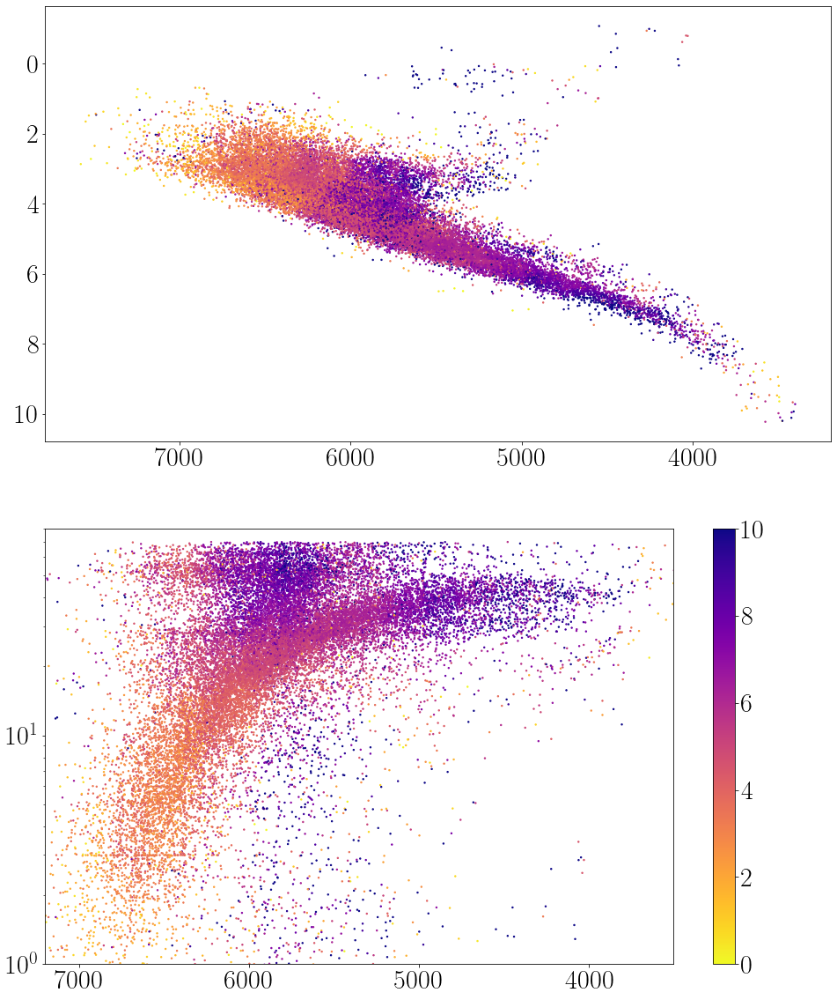

In [93]:
fig = plt.figure(figsize=(16, 20))
ax1 = fig.add_subplot(211)
ax1.scatter(adf.color_teffs, adf.abs_G, c=kin_ages, s=2, vmin=0, vmax=10, cmap="plasma_r")
ax1.invert_yaxis()
ax1.invert_xaxis()

ax2 = fig.add_subplot(212)
cb = ax2.scatter(adf.color_teffs, adf.Prot, c=kin_ages, s=2, vmin=0, vmax=10, cmap="plasma_r")
ax2.invert_xaxis()
ax2.set_yscale("log")
ax2.set_ylim(1, 80)
ax2.set_xlim(7200, 3500)
plt.colorbar(cb)

In [94]:
from bokeh.io import output_notebook, show
from bokeh.plotting import figure, output_file
from bokeh.models import ColumnDataSource, Range1d
from bokeh.layouts import gridplot
from bokeh.models import LinearColorMapper, ColorBar
from bokeh.transform import transform
output_notebook()

Loading BokehJS ...

In [123]:
source = ColumnDataSource(data=dict(teff=adf.color_teffs.values[::2], mg=G[::2], prot=adf.Prot.values[::2],
                                    age=kin_ages[::2]))
sun = ColumnDataSource(data=dict(teff=np.array([5777]), mg=np.array([4.67]), prot=np.array([26]),
                                 age=np.array([4.56])))

TOOLS = "box_select,lasso_select,help,reset"

# create a new plot and add a renderer
left = figure(tools=TOOLS, width=700, height=600, x_range=(7500, 3000), y_range=(11, -2))
# left = figure(tools=TOOLS, width=600, height=400)
color_mapper = LinearColorMapper(palette="Plasma256", low=0, high=10)

left.circle(x='teff', y='mg', color=transform('age', color_mapper), size=3, alpha=0.6, source=source)
left.circle(x='teff', y='mg', color=transform('age', color_mapper), line_color="black", size=15, alpha=1, source=sun)

left.xaxis.axis_label = 'Teff [K]'
left.yaxis.axis_label = 'M_G'
# left.y_range.flipped = True
# left.x_range.flipped = True

# create another new plot and add a renderer
right = figure(tools=TOOLS, width=700, height=600, y_axis_type="log", x_range=(7500, 3000), y_range=(1, 80))
# right = figure(tools=TOOLS, width=600, height=400, y_axis_type="log")

right.circle(x='teff', y='prot', color=transform('age', color_mapper), size=3, alpha=0.6, source=source)
right.circle(x='teff', y='prot', color=transform('age', color_mapper), line_color="black", size=15, alpha=1, source=sun)

color_bar = ColorBar(color_mapper=color_mapper, label_standoff=12, location=(0,0), title='Age [Gyr]')
right.add_layout(color_bar, 'right')

right.xaxis.axis_label = 'Teff [K]'
right.yaxis.axis_label = 'Prot [days]'
# right.x_range.flipped = True

p = gridplot([[left, right]])

output_file('CMD_TPD_aperiodic.html')

show(p)

In [97]:
source = ColumnDataSource(data=dict(teff=adf.color_teffs.values[::5], mg=G[::5], prot=adf.Prot.values[::5],
                                    age=adf.Prot_err[::5]))

TOOLS = "box_select,lasso_select,help,reset"

# create a new plot and add a renderer
# left = figure(tools=TOOLS, width=900, height=700)
left = figure(tools=TOOLS, width=600, height=400)
color_mapper = LinearColorMapper(palette="Plasma256", low=0, high=8)

left.circle(x='teff', y='mg', color=transform('age', color_mapper), size=3, alpha=0.6, source=source)
left.xaxis.axis_label = 'Teff [K]'
left.yaxis.axis_label = 'M_G'
left.y_range.flipped = True
left.x_range.flipped = True

# create another new plot and add a renderer
# right = figure(tools=TOOLS, width=900, height=700, y_axis_type="log")
right = figure(tools=TOOLS, width=600, height=400, y_axis_type="log")

right.circle(x='teff', y='prot', color=transform('age', color_mapper), size=3, alpha=0.6, source=source)
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=12, location=(0,0), title='Prot_err')
right.add_layout(color_bar, 'right')

right.xaxis.axis_label = 'Teff [K]'
right.yaxis.axis_label = 'Prot [days]'
right.x_range.flipped = True

p = gridplot([[left, right]])

# output_file('CMD_TPD_aperiodic.html')

show(p)

(1, 80)

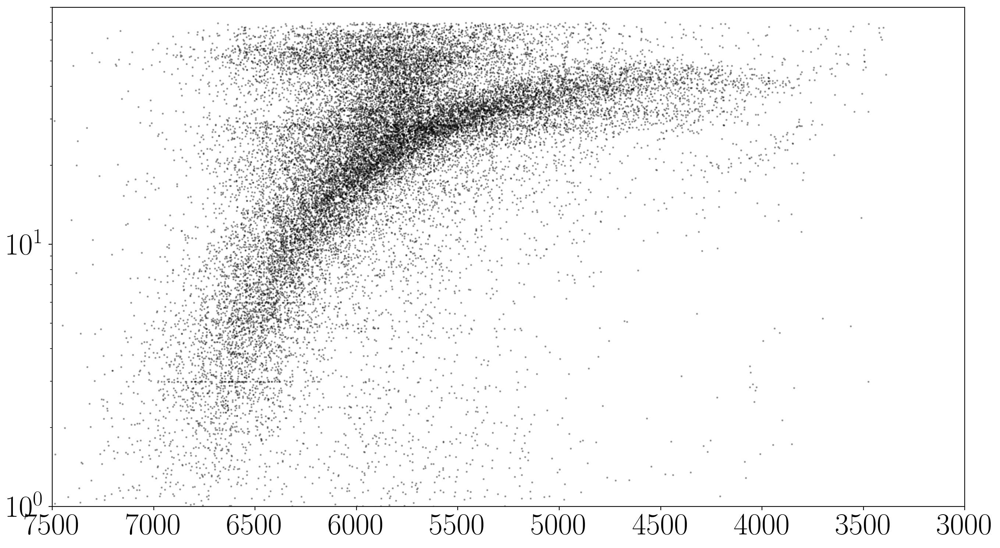

In [98]:
plt.figure(figsize=(16, 9), dpi=200)
plt.plot(adf.color_teffs, adf.Prot, "k.", ms=2, alpha=.3)
plt.gca().invert_xaxis()
plt.yscale("log")
plt.xlim(7500, 3000)
plt.ylim(1, 80)

In [4]:
df = pd.read_csv("../../aviary/mc_san_gaia_lam.csv")
adf = adf.iloc[adf.logg.values > 4.2]

/Users/rangus/Applications/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (112) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
/Users/rangus/Applications/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (4,5) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


Plot on a CMD.

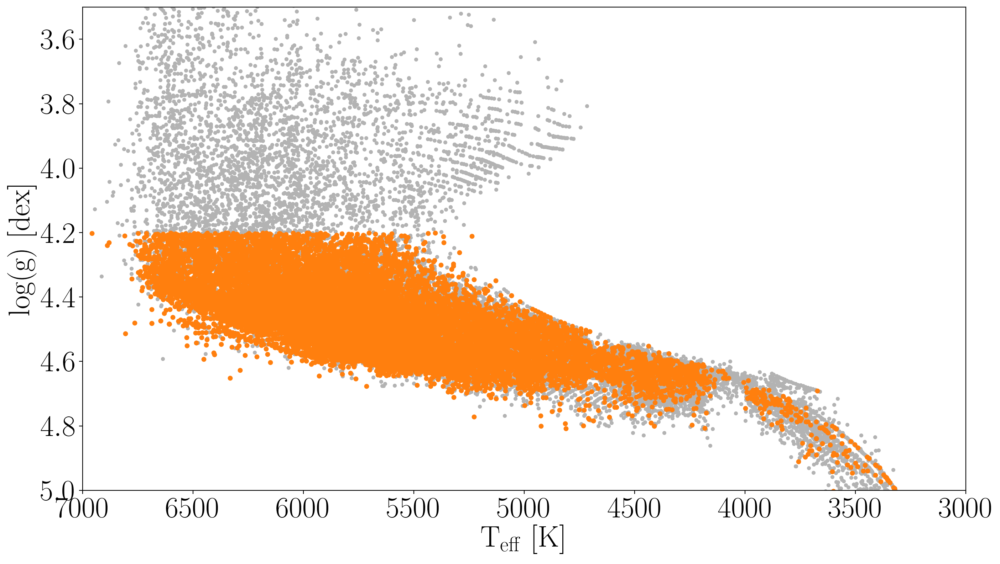

In [5]:
plt.figure(figsize=(16, 9), dpi=200)
plt.plot(df.teff.values, df.logg.values, ".", zorder=0, color=".7")
plt.plot(adf.teff.values, adf.logg.values, ".", zorder=0, color="C1", alpha=1, ms=10, mec="none")

plt.xlim(7000, 3000)
plt.ylim(5, 3.5)
plt.xlabel("$\mathrm{T_{eff}~[K]}$")
plt.ylabel("$\mathrm{log(g)~[dex]}$");

Lines of constant Rossby number.

In [6]:
from scipy import interpolate

def teff_to_mass(teff):
    df = pd.read_csv("../../../kinematics-and-rotation/kinematics_and_rotation/mamajek_table.csv", usecols=["Teff", "Msun"])
    f = interpolate.interp1d(df.Teff, df.Msun)
    return f(teff)

def convective_overturn_time(M):
    log_tau = 1.16 - 1.49*np.log10(M) - .54*(np.log10(M))**2
    return 10**log_tau

teffs = np.linspace(3300, 7000, 100)
ro = np.linspace(.1, 3, 10)
TEFF, RO = np.meshgrid(teffs, ro)
MASS = teff_to_mass(TEFF)
TAU = convective_overturn_time(MASS)

PROT = RO * TAU  # ro = prot/tau
print(np.shape(PROT))

(10, 100)


/Users/rangus/Applications/anaconda3/lib/python3.7/site-packages/pandas/core/computation/expressions.py:178: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  f"evaluating in Python space because the {repr(op_str)} "


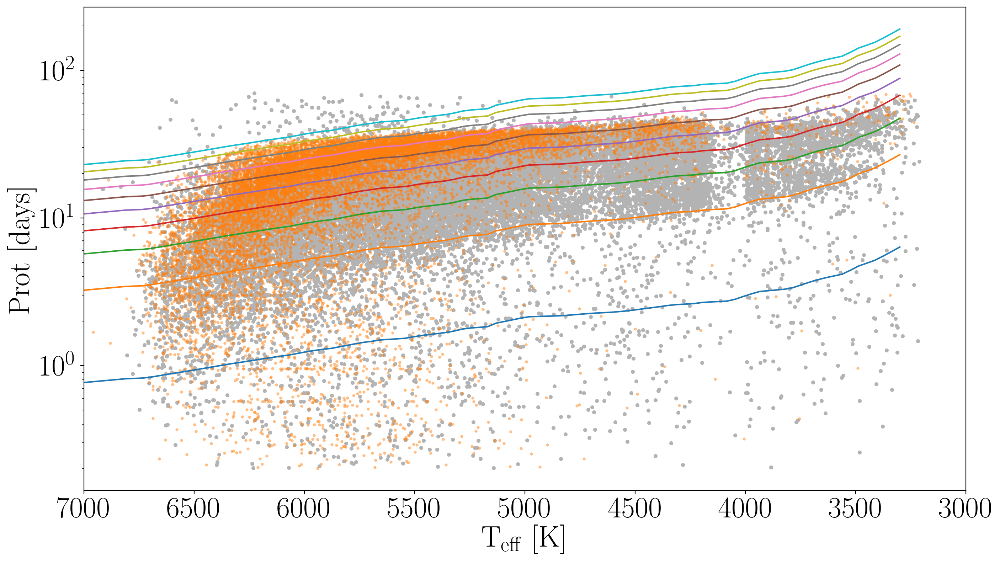

In [7]:
plt.figure(figsize=(16, 9), dpi=200)

no_subs = df.logg.values > 4.2
ano_subs = (adf.logg.values > 4.2) * (adf.age < 5)
plt.plot(df.teff.values[no_subs], df.Prot.values[no_subs], ".", zorder=0, color=".7")
plt.plot(adf.teff.values[ano_subs], adf.Prot.values[ano_subs], ".", zorder=1, color="C1", alpha=.5, mec="none")
# plt.scatter(adf.teff.values[ano_subs], adf.Prot.values[ano_subs], c=adf.age.values[ano_subs], zorder=2, edgecolor="", vmin=0, vmax=14, cmap="viridis_r")
# plt.colorbar()

for i in range(10):
    plt.plot(TEFF[i, :], PROT[i, :])

plt.xlim(7000, 3000)
plt.yscale("log")
plt.xlabel("$\mathrm{T_{eff}~[K]}$")
plt.ylabel("$\mathrm{Prot~[days]}$");

In [8]:
def vplot(teff, prot, vz, dispersions=None, dt=500, dp=.4, s=45, alpha=.5, nbounds=9, max_bound=24, xlims=(6700, 3200), ylims=(.15, 85)):
    
    if dispersions is None:
        dispersions = av.calc_dispersion_bins(teff, np.log10(prot), vz, dt, dp)
    
    cmap = plt.cm.plasma_r
    cmaplist = [cmap(i) for i in range(cmap.N)]
    cmap = matplotlib.colors.LinearSegmentedColormap.from_list(
        'Custom cmap', cmaplist, cmap.N)
    bounds = np.linspace(0, max_bound, nbounds)
    norm = matplotlib.colors.BoundaryNorm(bounds, cmap.N)

    fig = plt.figure(figsize=(16, 9), dpi=200)

    f = np.isfinite(dispersions)
    plt.scatter(teff[f], prot[f], c=dispersions[f],
                s=s, alpha=alpha, edgecolor="", vmin=5, vmax=22, cmap=cmap, norm=norm, zorder=1, rasterized=True)
    plt.yscale("log")
    plt.xlabel("$\mathrm{T_{eff}~[K]}$")
    plt.ylabel("$\mathrm{Rotation~period~[days]}$")

    color_bar = plt.colorbar(label="$\mathrm{\sigma_{vb}~[kms^{-1}]}$")
    color_bar.set_alpha(1)
    color_bar.draw_all()

    xs = np.arange(3000, 6000, dt)
    ys = 10**np.arange(1, 2, dp)

    xspot, yspot = 3400, 2
    xs = np.linspace(xspot, xspot+dt, 100)
    plt.fill_between(xs, yspot, 10**(np.log10(yspot) + dp), color="k", alpha=.2)

    plt.ylim(ylims)
    plt.xlim(xlims)
    return fig, dispersions

Plot velocity dispersions of just the aperiodic stars.

100%|██████████| 14618/14618 [00:04<00:00, 3395.81it/s]


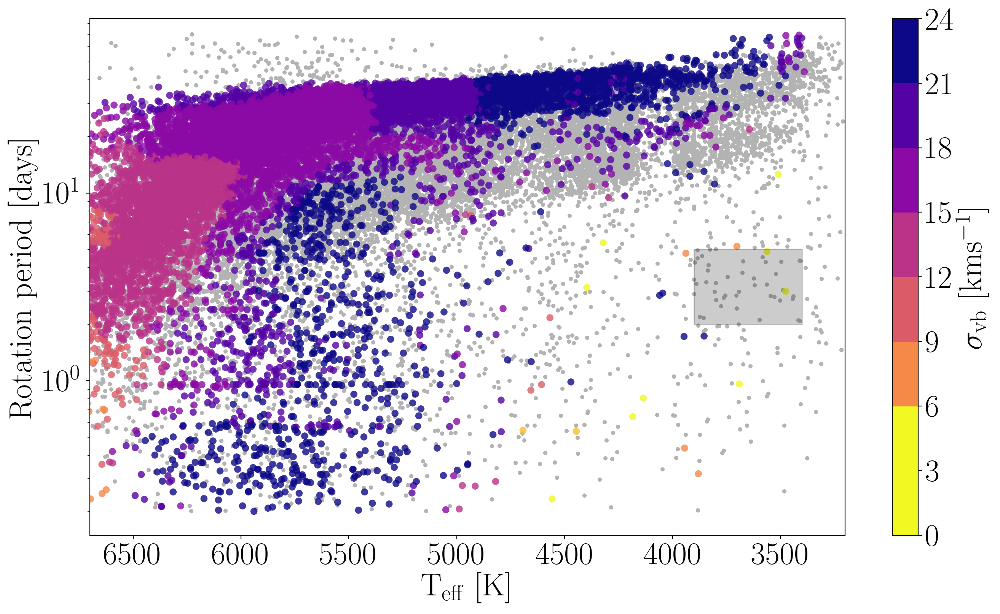

In [9]:
fig = vplot(adf.color_teffs.values[ano_subs], adf.Prot.values[ano_subs], adf.vb.values[ano_subs], alpha=.8);
plt.plot(df.teff.values[no_subs], df.Prot.values[no_subs], ".", zorder=0, color=".7")

100%|██████████| 22771/22771 [00:05<00:00, 3996.28it/s]


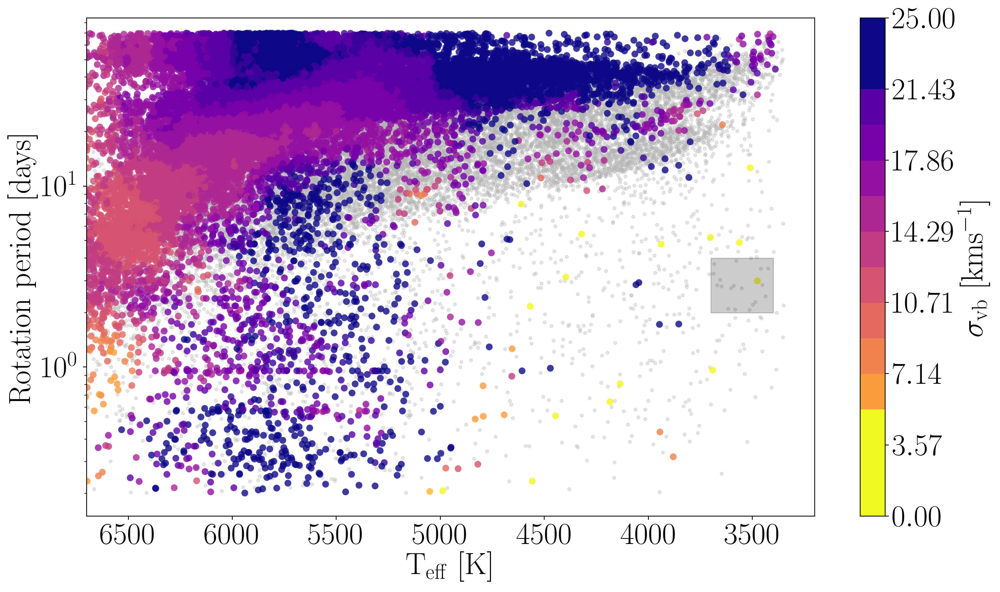

In [13]:
fig, dispersions = vplot(adf.color_teffs.values, adf.Prot.values, adf.vb.values, alpha=.8, nbounds=15, max_bound=25, dt=300, dp=.3);
plt.plot(df.color_teffs.values[no_subs], df.Prot.values[no_subs], ".", zorder=0, color=".7", alpha=.3);

Plot velocity dispersions of just the periodic stars.

 77%|███████▋  | 24536/31713 [00:06<00:02, 3412.33it/s]/Users/rangus/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
100%|██████████| 31713/31713 [00:08<00:00, 3929.64it/s]


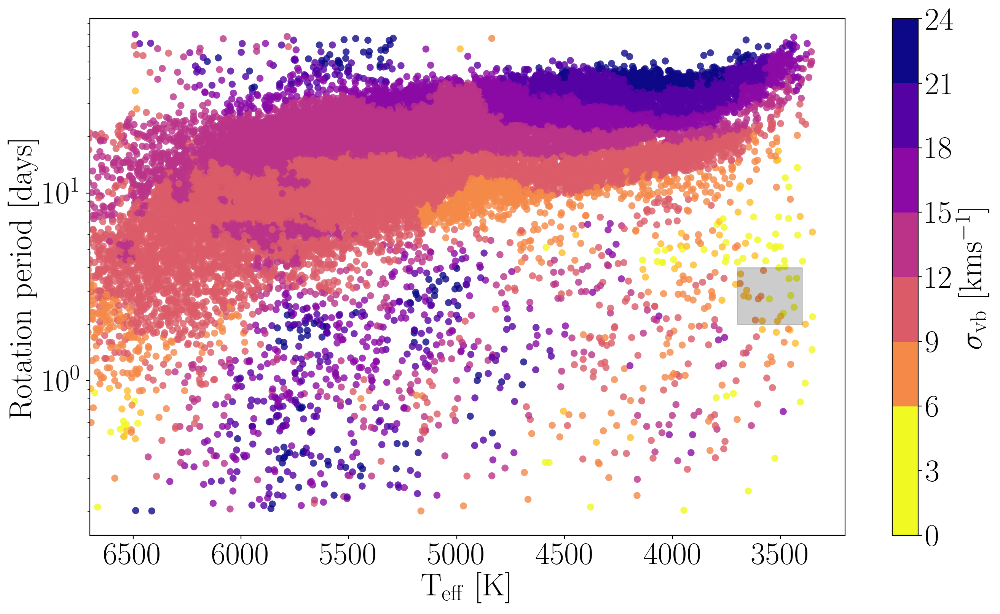

In [23]:
disp = vplot(df.color_teffs.values[no_subs], df.Prot.values[no_subs], df.vb.values[no_subs], alpha=.8, dt=300, dp=.3);

Now combine them :-)

In [136]:
bdf = pd.merge(df, adf, on=["kepid", "color_teffs", "Prot"], how="outer", suffixes=["", "_2"])
bdf.drop_duplicates(subset="kepid")
print(np.shape(bdf), np.shape(df), np.shape(adf))

(58099, 335) (35328, 182) (22771, 156)


/Users/rangus/Applications/anaconda3/lib/python3.7/site-packages/pandas/core/computation/expressions.py:178: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  f"evaluating in Python space because the {repr(op_str)} "
 62%|██████▏   | 36246/58099 [00:13<00:07, 2821.86it/s]/Users/rangus/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1116: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
100%|██████████| 58099/58099 [00:22<00:00, 2568.15it/s]


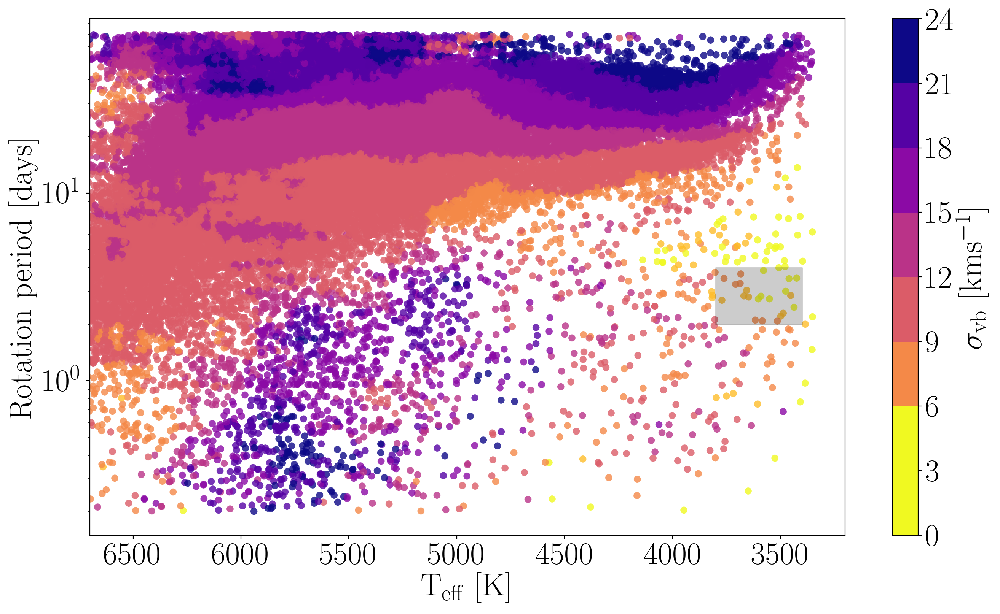

In [137]:
bno_subs = (bdf.logg.values > 4.2) * (bdf.age < 5)
vplot(bdf.color_teffs.values, bdf.Prot.values, bdf.vb.values, alpha=.8, dp=.3, dt=400);

In [14]:
p_mp, p_mr, p_a = av.get_avr_coefficients()
kin_ages = av.v_to_age(dispersions, p_mr)

(6700, 3200)

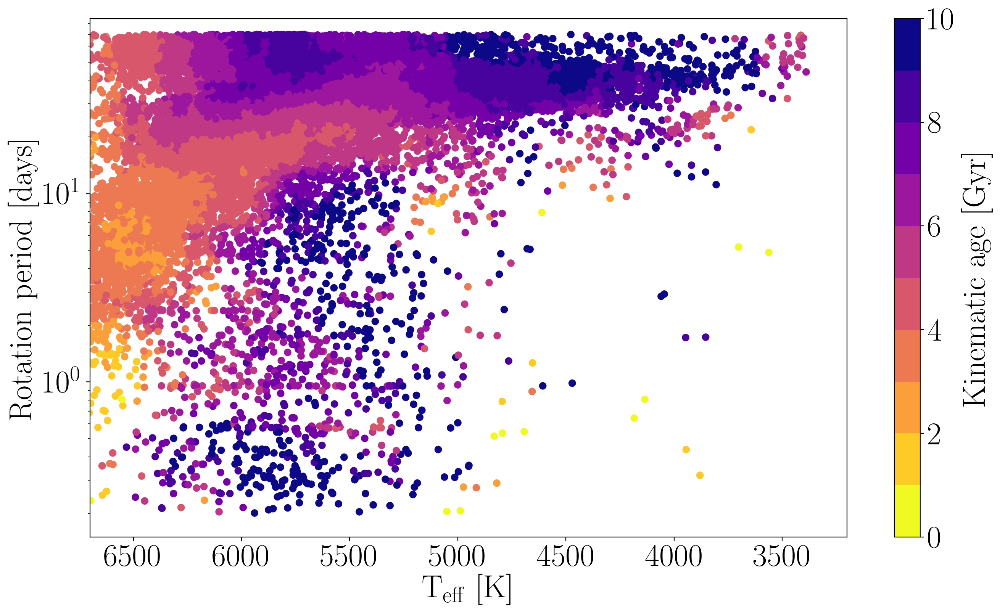

In [15]:
cmap = plt.cm.plasma_r
cmaplist = [cmap(i) for i in range(cmap.N)]
cmap = matplotlib.colors.LinearSegmentedColormap.from_list('Custom cmap', cmaplist, cmap.N)
bounds = np.linspace(0, 10, 11)
norm = matplotlib.colors.BoundaryNorm(bounds, cmap.N)

fig = plt.figure(figsize=(16, 9), dpi=200)

plt.scatter(adf.color_teffs, adf.Prot, c=kin_ages, s=50, alpha=1, edgecolor="", cmap=cmap, norm=norm, zorder=1, rasterized=True)
plt.yscale("log")
plt.xlabel("$\mathrm{T_{eff}~[K]}$")
plt.ylabel("$\mathrm{Rotation~period~[days]}$")

color_bar = plt.colorbar(label="$\mathrm{Kinematic~age~[Gyr]}$")
color_bar.set_alpha(1)
color_bar.draw_all()

plt.ylim(.15, 85)
plt.xlim(6700, 3200)

In [16]:
clusters = pd.read_csv("../../data/gyro_clusters_draft-2020April08.csv")
clusters.head()
no_pr = clusters.AGE.values != 670
prot, teff, age_myr = clusters.PROT.values[no_pr], clusters.TEFF.values[no_pr], clusters.AGE.values[no_pr]
age = age_myr * 1e-3

prae = pd.read_csv("../figure_code/praesepe_clipped.csv")
p_prot, p_teff, p_age = prae.prot.values, prae.teff.values, prae.age.values

# Load asteroseismic stars.
ast = pd.read_csv("../../data/vanSaders.txt")
a_prot, a_teff, a_age = ast.period.values, ast.teff.values, ast.AMP_age.values

benchmark = pd.read_csv("../../data/curtis.csv", skiprows=51)
b_prot, b_teff, b_age = benchmark.prot.values, benchmark.teff.values, benchmark.age.values

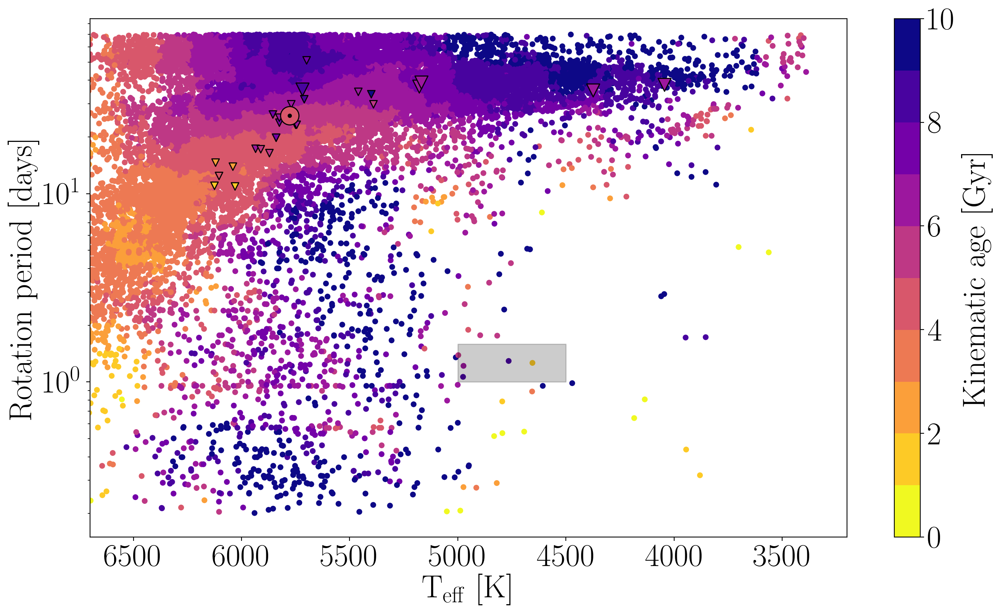

In [17]:
cmap = plt.cm.plasma_r
cmaplist = [cmap(i) for i in range(cmap.N)]
cmap = matplotlib.colors.LinearSegmentedColormap.from_list('Custom cmap', cmaplist, cmap.N)
bounds = np.linspace(0, 10, 11)
norm = matplotlib.colors.BoundaryNorm(bounds, cmap.N)
vmin, vmax = 0, 10

fig = plt.figure(figsize=(16, 9), dpi=200)

plt.scatter(adf.color_teffs, adf.Prot, c=kin_ages, s=30, alpha=1, edgecolor="", vmin=vmin, vmax=vmax, cmap=cmap, norm=norm, zorder=1, rasterized=True)
plt.scatter(a_teff, a_prot, c=a_age, cmap=cmap, norm=norm, vmin=vmin, vmax=vmax, s=50, marker="v", edgecolor="k")
plt.scatter(b_teff[:-1], b_prot[:-1], c=b_age[:-1], cmap=cmap, norm=norm, vmin=vmin, vmax=vmax, s=150, marker="v", edgecolor="k")
plt.scatter([b_teff[-1]], [b_prot[-1]], c=[b_age[-1]], cmap=cmap, norm=norm, vmin=vmin, vmax=vmax, s=300, edgecolor="k")
plt.plot([b_teff[-1]], [b_prot[-1]], "k.")

plt.yscale("log")
plt.xlabel("$\mathrm{T_{eff}~[K]}$")
plt.ylabel("$\mathrm{Rotation~period~[days]}$")

color_bar = plt.colorbar(label="$\mathrm{Kinematic~age~[Gyr]}$")
color_bar.set_alpha(1)
color_bar.draw_all()

dt = 500
dp = .2
xspot, yspot = 4500, 1
xs = np.linspace(xspot, xspot+dt, 100)
plt.fill_between(xs, yspot, 10**(np.log10(yspot) + dp), color="k", alpha=.2)

plt.ylim(.15, 85)
plt.xlim(6700, 3200);

In [34]:
p = p_mr
a_disps = av.calc_dispersion_bins_target(a_teff, np.log10(a_prot), adf.color_teffs.values,
                                         np.log10(adf.Prot.values), adf.vb.values, dt, dp)
a_ages = av.v_to_age(a_disps, p)
b_disps = av.calc_dispersion_bins_target(b_teff[:-1], np.log10(b_prot[:-1]), adf.color_teffs.values,
                                         np.log10(adf.Prot.values), adf.vb.values, dt, dp)
b_ages = av.v_to_age(b_disps, p)
sun_disps = av.calc_dispersion_bins_target([b_teff[-1]], [np.log10(b_prot[-1])], adf.color_teffs.values,
                                           np.log10(adf.Prot.values), adf.vb.values, dt, dp)
sun_ages = av.v_to_age(sun_disps, p)

a_disps_p = av.calc_dispersion_bins_target(a_teff, np.log10(a_prot), df.color_teffs.values,
                                         np.log10(df.Prot.values), df.vb.values, dt, dp)
a_ages_p = av.v_to_age(a_disps_p, p)
b_disps_p = av.calc_dispersion_bins_target(b_teff[:-1], np.log10(b_prot[:-1]), df.color_teffs.values,
                                         np.log10(df.Prot.values), df.vb.values, dt, dp)
b_ages_p = av.v_to_age(b_disps_p, p)
sun_disps_p = av.calc_dispersion_bins_target([b_teff[-1]], [np.log10(b_prot[-1])], df.color_teffs.values,
                                           np.log10(df.Prot.values), df.vb.values, dt, dp)
sun_ages_p = av.v_to_age(sun_disps_p, p)

100%|██████████| 1/1 [00:00<00:00, 532.47it/s]


Text(0, 0.5, 'kinematic age')

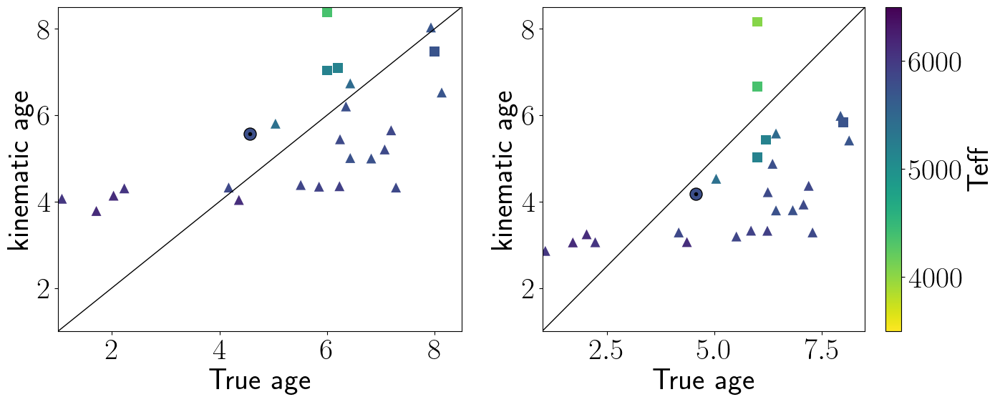

In [36]:
fig = plt.figure(figsize=(16, 6), dpi=100)
ax0 = fig.add_subplot(121)

m = (age > 0.12) * (teff > 3500)

vmin = 3500
vmax = 6500
alpha = 1
ax0.scatter(a_age, a_ages, c=a_teff, marker="^", s=100, alpha=alpha, edgecolor="", vmin=vmin, vmax=vmax, cmap="viridis_r")
ax0.scatter(b_age[:-1], b_ages, c=b_teff[:-1], marker="s", s=100, alpha=alpha, edgecolor="", vmin=vmin, vmax=vmax, cmap="viridis_r")
ax0.scatter(4.56, sun_ages, c=[5777], marker="o", s=150, alpha=alpha, edgecolor="k", vmin=vmin, vmax=vmax, cmap="viridis_r")
ax0.plot(4.56, sun_ages, "k.")
# ax0.colorbar(label="Teff")
xs = np.linspace(0, 8.5, 100)
ax0.plot(xs, xs, "k", lw=1)
ax0.set_xlim(1, 8.5)
ax0.set_ylim(1, 8.5)

ax0.set_xlabel("True age")
ax0.set_ylabel("kinematic age")

ax1 = fig.add_subplot(122)
ax1.scatter(a_age, a_ages_p, c=a_teff, marker="^", s=100, alpha=alpha, edgecolor="", vmin=vmin, vmax=vmax, cmap="viridis_r")
ax1.scatter(b_age[:-1], b_ages_p, c=b_teff[:-1], marker="s", s=100, alpha=alpha, edgecolor="", vmin=vmin, vmax=vmax, cmap="viridis_r")
cb = ax1.scatter(4.56, sun_ages_p, c=[5777], marker="o", s=150, alpha=alpha, edgecolor="k", vmin=vmin, vmax=vmax, cmap="viridis_r")
ax1.plot(4.56, sun_ages_p, "k.")
plt.colorbar(cb, label="Teff")
xs = np.linspace(0, 8.5, 100)
ax1.plot(xs, xs, "k", lw=1)
ax1.set_xlim(1, 8.5)
ax1.set_ylim(1, 8.5)

ax1.set_xlabel("True age")
ax1.set_ylabel("kinematic age")

Text(0, 0.5, 'kinematic age')

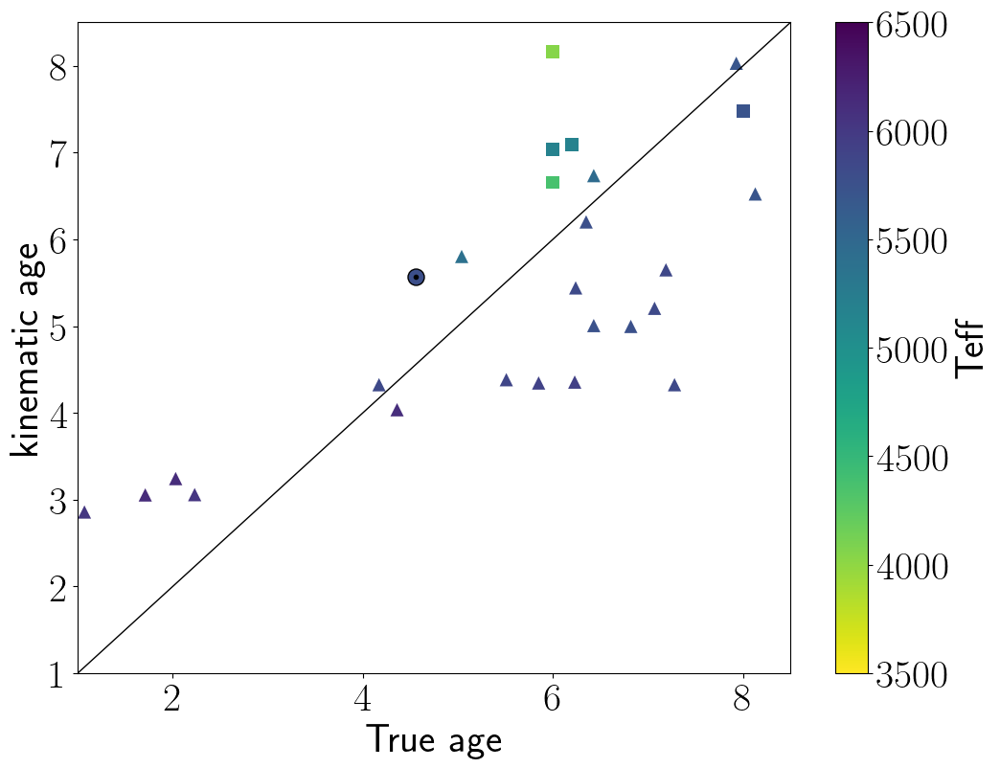

In [43]:
fig = plt.figure(figsize=(12, 9), dpi=100)

m = (age > 0.12) * (teff > 3500)

vmin = 3500
vmax = 6500
alpha = 1

young = a_age < 3
cool = b_teff[:-1] < 5000
plt.scatter(a_age[young], a_ages_p[young], c=a_teff[young], marker="^", s=100, alpha=alpha, edgecolor="", vmin=vmin, vmax=vmax, cmap="viridis_r")
plt.scatter(a_age[~young], a_ages[~young], c=a_teff[~young], marker="^", s=100, alpha=alpha, edgecolor="", vmin=vmin, vmax=vmax, cmap="viridis_r")
plt.scatter(b_age[:-1][cool], b_ages_p[cool], c=b_teff[:-1][cool], marker="s", s=100, alpha=alpha, edgecolor="", vmin=vmin, vmax=vmax, cmap="viridis_r")
plt.scatter(b_age[:-1][~cool], b_ages[~cool], c=b_teff[:-1][~cool], marker="s", s=100, alpha=alpha, edgecolor="", vmin=vmin, vmax=vmax, cmap="viridis_r")
plt.scatter(4.56, sun_ages, c=[5777], marker="o", s=150, alpha=alpha, edgecolor="k", vmin=vmin, vmax=vmax, cmap="viridis_r")
plt.plot(4.56, sun_ages, "k.")
plt.colorbar(label="Teff")
xs = np.linspace(0, 8.5, 100)
plt.plot(xs, xs, "k", lw=1)
plt.xlim(1, 8.5)
plt.ylim(1, 8.5)

plt.xlabel("True age")
plt.ylabel("kinematic age")

What are those rapidly rotating old stars? Are they binaries or subgiants?

In [1]:
plt.plot(df.vz, df.vb, ".", ms=1)
xs = np.linspace(-100, 100)
plt.plot(xs, xs, "k--")
plt.xlim(-100, 100)
plt.ylim(-100, 100)


NameError: name 'plt' is not defined